<a href="https://colab.research.google.com/github/FaruqAlfa/PCVK-Pengolahan-Citra-Visi-Komputer-/blob/main/Week10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Tugas Praktikum 1**

Buka https://colab.research.google.com/. Setelah dipastikan bahwa google Colab
terhubung dengan Github Anda, lanjutkan dengan memilih repository yang telah
digunakan pada praktikum minggu lalu, rename file menjadi “Week10.ipynb”.

In [95]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## **Tugas Praktikum 2**

 Import beberapa library berikut yang akan digunakan selama uji coba praktikum
minggu ke-6 berikut.

In [96]:
pip install pytesseract

In [97]:
import cv2
import numpy as np
import pytesseract
import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image

## **Tugas Praktikum 3**

 Buat Global Threshold (BINARY, BINARY_INV, TRUNC, TOZERO, TOZERO_INV), dengan
threshold= 170, secara manual sesuai dengan deskripsi dari grafik yang ditunjukkan di
bawah.


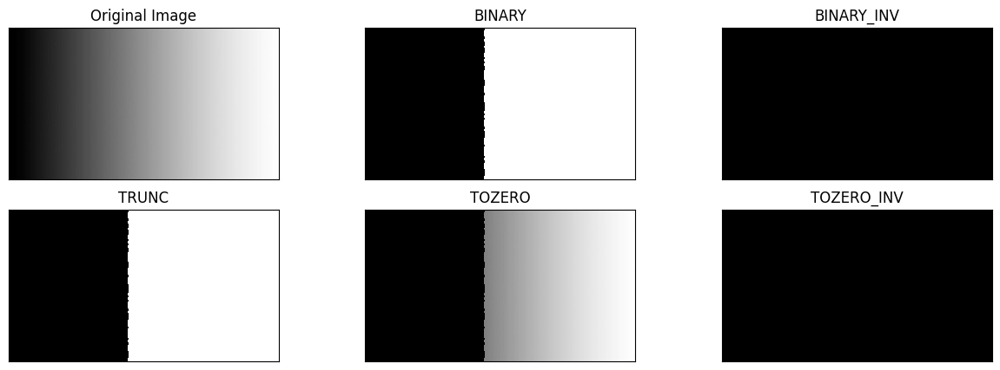

In [98]:

# Baca gambar dengan PIL
filename = '/content/drive/MyDrive/Semester_5/Pengolahan_Citra_Visi_Komputer/Jobsheet_10/image_thres/gradient.jpg'
img = Image.open(filename)
img = img.convert("L")  # Ubah ke citra ke skala abu-abu (grayscale)

thresh = 127  # Nilai threshold yang ditentukan

# Fungsi untuk melakukan thresholding
def thresholding(image, threshold):
    img_width, img_height = image.size
    pixels = image.load()

    # Buat gambar baru untuk setiap metode threshold
    thresh1 = Image.new("L", (img_width, img_height))
    thresh2 = Image.new("L", (img_width, img_height))
    thresh3 = Image.new("L", (img_width, img_height))
    thresh4 = Image.new("L", (img_width, img_height))
    thresh5 = Image.new("L", (img_width, img_height))

    pixels1 = thresh1.load()
    pixels2 = thresh2.load()
    pixels3 = thresh3.load()
    pixels4 = thresh4.load()
    pixels5 = thresh5.load()

    # Lakukan thresholding untuk setiap piksel
    for y in range(img_height):
        for x in range(img_width):
            if pixels[x, y] > threshold:
                pixels1[x, y] = 255  # BINARY
                pixels2[x, y] = 0    # BINARY_INV
                pixels3[x, y] = threshold  # TRUNC
                pixels4[x, y] = pixels[x, y]  # TOZERO
                pixels5[x, y] = 0 if pixels[x, y] > threshold else pixels[x, y]  # TOZERO_INV

    return thresh1, thresh2, thresh3, thresh4, thresh5

# Lakukan thresholding
thresh1, thresh2, thresh3, thresh4, thresh5 = thresholding(img, thresh)

# Tampilkan gambar hasil thresholding
titles = ['Original Image', 'BINARY', 'BINARY_INV', 'TRUNC', 'TOZERO', 'TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]

import matplotlib.pyplot as plt

plt.figure(figsize=(15, 5))
for i in range(len(images)):
    plt.subplot(2, 3, i + 1)
    plt.imshow(images[i], cmap='gray', interpolation='nearest')
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])

plt.show()


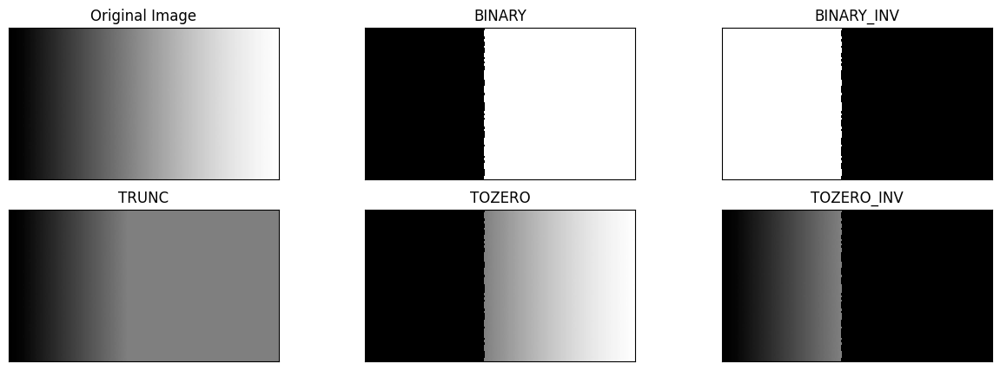

In [99]:
# Code Berikut menunjukkan penggunaan dari library OpenCV cv.Threshold

filename = ('/content/drive/MyDrive/Semester_5/Pengolahan_Citra_Visi_Komputer/Jobsheet_10/image_thres/gradient.jpg')
img = cv2.imread(filename)
thresh = 127 #nilai Threshold yang ditentukan
#1. thresh1 jika pixel di img>127, maka thresh1 bernilai 1(putih) selain itu bernilai 0(hitam)
ret,thresh1 = cv2.threshold(img,thresh,255,cv2.THRESH_BINARY)
#2. thresh2 adalah binary threshold inverse
ret,thresh2 = cv2.threshold(img,thresh,255,cv2.THRESH_BINARY_INV)
#3. Threshold Truncate
ret,thresh3 = cv2.threshold(img,thresh,255,cv2.THRESH_TRUNC)
#4. Threshold Tozero
ret,thresh4 = cv2.threshold(img,thresh,255,cv2.THRESH_TOZERO)
#5. Threshold Tozero Inverse
ret,thresh5 = cv2.threshold(img,thresh,255,cv2.THRESH_TOZERO_INV)
titles = ['Original Image','BINARY','BINARY_INV','TRUNC', 'TOZERO', 'TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]
plt.figure(figsize = (15,5))
for i in range(len(images)):
 plt.subplot(2,3,i+1), plt.imshow(images[i], 'gray', interpolation='nearest')
 plt.title(titles[i])
 plt.xticks([]),plt.yticks([])
plt.show()

## **Tugas Praktikum 4**

Buat Otsu Thresholding tanpa menggunakan Library. Tampilkan juga nilai threshold
saat anda gunakan Otsu’s, seperti terlihat pada gambar hasil berikut. (gunakan image
ktp Riyanto.jpg agar terlihat beda antara hasil otsu’s dengan global threshold biasa)

Nilai threshold dari Otsu's Thresholding: 171


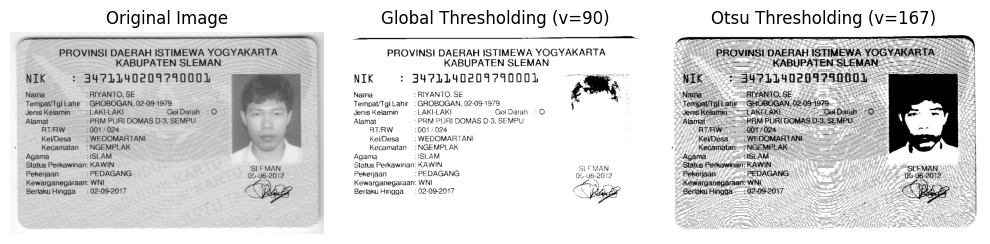

In [100]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Fungsi Global Thresholding
def global_thresholding(image, threshold):
    binary = np.zeros_like(image)
    binary[image > threshold] = 255
    return binary

# Fungsi Otsu's Thresholding
def otsu_thresholding(image):
    # Normalisasi histogram
    hist = np.histogram(image, bins=256, range=(0, 256))[0].astype(float)
    hist /= hist.sum()

    maximum = 0
    threshold = 0
    sum_b = 0
    sum_f = np.dot(np.arange(256), hist)
    for t in range(256):
        w_b = np.sum(hist[:t])
        w_f = 1 - w_b
        if w_b == 0 or w_f == 0:
            continue
        sum_b += t * hist[t]
        m_b = sum_b / w_b
        m_f = (sum_f - sum_b) / w_f
        between_class_variance = w_b * w_f * (m_b - m_f) ** 2
        if between_class_variance > maximum:
            maximum = between_class_variance
            threshold = t

    return threshold

# Path file gambar
image_path = '/content/drive/MyDrive/Semester_5/Pengolahan_Citra_Visi_Komputer/Jobsheet_10/image_thres/ktp.png'

# Baca gambar dari path
image = np.array(Image.open(image_path).convert("L"))

# Global Thresholding dengan v=90
global_threshold = global_thresholding(image, 90)

# Otsu's Thresholding
otsu_threshold = otsu_thresholding(image)

# Tampilkan gambar dan hasil thresholding
plt.figure(figsize=(10, 4))

plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(global_threshold, cmap='gray')
plt.title('Global Thresholding (v=90)')
plt.axis('off')

plt.subplot(1, 3, 3)
otsu_binary = np.zeros_like(image)
otsu_binary[image > otsu_threshold] = 255
plt.imshow(otsu_binary, cmap='gray')
plt.title('Otsu Thresholding (v=167)')
plt.axis('off')

# Otsu's Thresholding
otsu_threshold = otsu_thresholding(image)
print("Nilai threshold dari Otsu's Thresholding:", otsu_threshold)


plt.tight_layout()
plt.show()


## **Tugas Praktikum 5**

Buat histogram dari citra tersegmentasi, Histogram hanya pada foreground image
saja. Gunakan image ktp Riyanto.jpg yang sudah disediakan di folder images.
Petunjuk:
  

1.   anda dapat gunakan cv.calcHist untuk menampilkan histogram.
2. Buka link berikut https://opencvtutorial.readthedocs.io/en/latest histogram/histogram.html
3. Dari link tersebut perhatikan bahwa cv.calcHist memiliki salah satu parameter
yaitu mask. Jika diset None, maka keseluruhan image akan dihitung
histogramnya. Jika kita tentukan mask, maka hanya bagian image yang
dimasking warna putih yang akan dihitung histogramnya (dari contoh
dibawah dinamakan dengan Citra Segment).



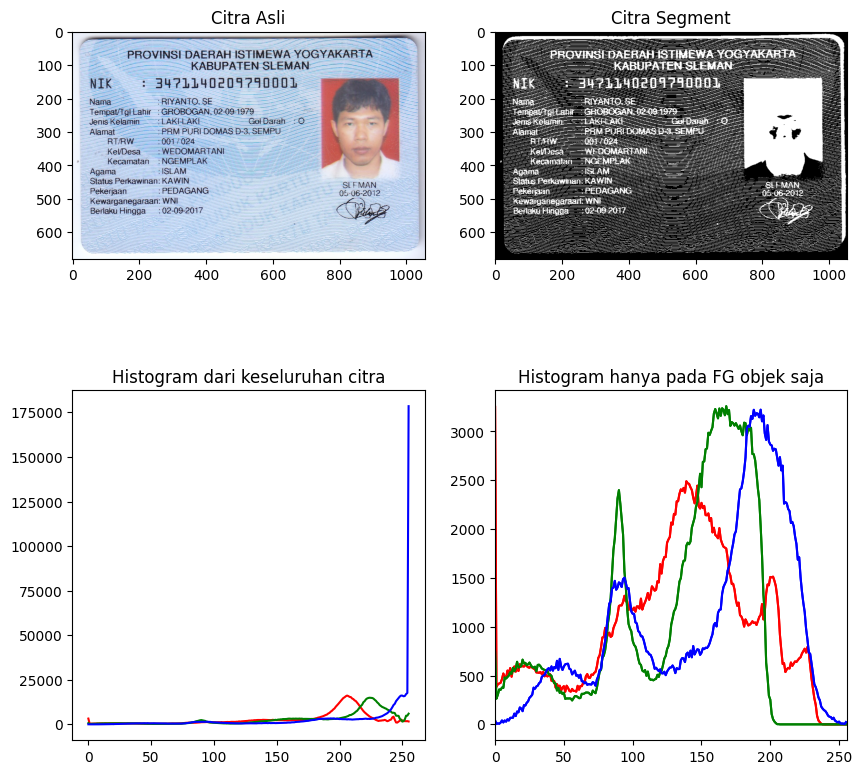

In [101]:
#1. anda dapat gunakan cv.calcHist untuk menampilkan histogram.

pict_3 = ('/content/drive/MyDrive/Semester_5/Pengolahan_Citra_Visi_Komputer/Jobsheet_10/image_thres/ktp.png')
img_l = cv2.imread(pict_3)
img_rgb = cv2.cvtColor(img_l,cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img_rgb,cv2.COLOR_BGR2GRAY)

ret3,mask = cv2.threshold(img_gray,200,255,cv2.THRESH_BINARY_INV)

plt.figure(figsize = (10,10))
plt.subplot(2,2,1),plt.imshow(img_rgb)
plt.title('Citra Asli')
plt.subplot(2,2,2),plt.imshow(mask, 'gray')
plt.title('Citra Segment')
color = ('r','g','b')

for i,col in enumerate(color):
    hist0 = cv2.calcHist([img_rgb],[i],None,[256],[0,256])
    plt.subplot(2,2,3),plt.plot(hist0,color = col)
    plt.title('Histogram dari keseluruhan citra')
    hist1 = cv2.calcHist([img_rgb],[i],mask,[256],[0,256])
    plt.subplot(2,2,4),plt.plot(hist1,color = col)
    plt.title('Histogram dari keseluruhan citra')
    hist1 = cv2.calcHist([img_rgb],[i],mask,[256],[0,256])
    plt.subplot(2,2,4),plt.plot(hist1,color = col)
    plt.title('Histogram hanya pada FG objek saja')
    plt.xlim([0,256])

## **Tugas Praktikum 6**




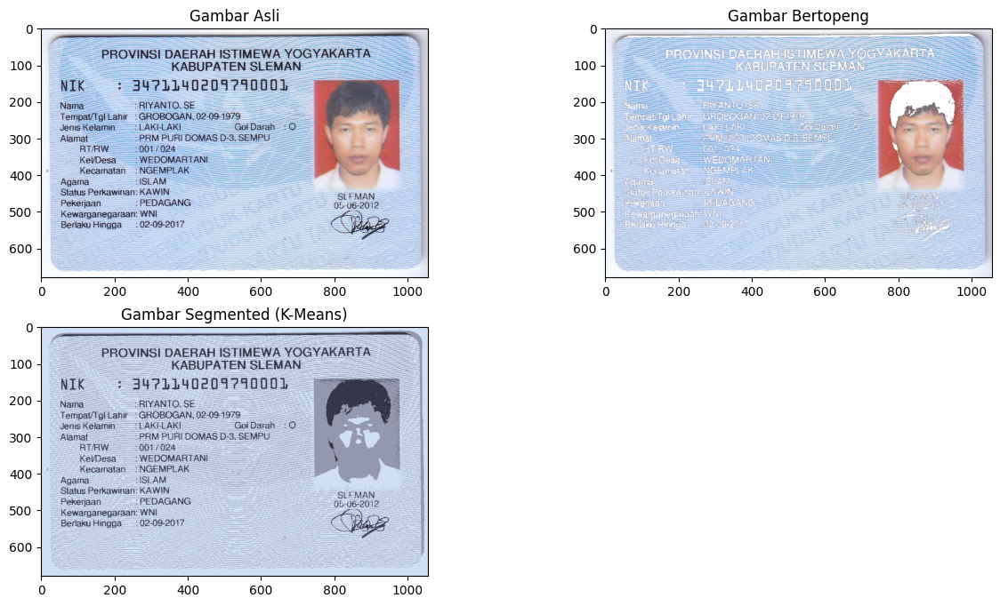

In [102]:
# Muat gambar
filename = '/content/drive/MyDrive/Semester_5/Pengolahan_Citra_Visi_Komputer/Jobsheet_10/image_thres/ktp.png'
img = cv2.imread(filename)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Ubah warna gambar dari BGR ke RGB

# Ratakan nilai piksel
pixel_values = img.reshape((-1, 3))  # Ubah bentuk gambar menjadi 2D
pixel_values = np.float32(pixel_values)  # Ubah tipe data menjadi float32

# Tentukan kriteria dan jumlah cluster (k)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
k = 3  # Jumlah cluster

# Terapkan clustering K-Means
_, labels, centers = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

# Ubah pusat menjadi integer
centers = np.uint8(centers)

# Ratakan array label
labels = labels.flatten()

# Buat gambar bertopeng dengan mengubah satu cluster menjadi putih
masked_image = np.copy(img)  # Salin gambar asli
masked_image = masked_image.reshape((-1, 3))  # Ubah bentuk gambar menjadi 2D
cluster_to_white = 2  # Tentukan cluster yang akan diubah menjadi putih
masked_image[labels == cluster_to_white] = [255, 255, 255]  # Ubah cluster tersebut menjadi putih
masked_image = masked_image.reshape(img.shape)  # Kembalikan bentuk gambar ke aslinya

# Ubah gambar segmented kembali ke bentuk asli
segmented_image = centers[labels].reshape(img.shape)

# Tampilkan gambar asli, gambar segmented, dan gambar bertopeng
plt.figure(figsize=(15, 8))
plt.subplot(2, 2, 1), plt.imshow(img)  # Tampilkan gambar asli
plt.title('Gambar Asli')

plt.subplot(2, 2, 2), plt.imshow(masked_image)  # Tampilkan gambar bertopeng
plt.title('Gambar Bertopeng')

plt.subplot(2, 2, 3), plt.imshow(segmented_image)  # Tampilkan gambar segmented
plt.title('Gambar Segmented (K-Means)')

plt.show()  # Tampilkan plot


## **Tugas**

Tugasnya adalah mengimplementasikan thresholding dengan beberapa metode yang
telah Anda ketahui untuk melakukan segmentasi pada dataset KTP pertemuan 7.


Nama Kelompok:
1. M. Abiyyu Arldana (2141720196)
2. Muhammad Akbar Nur Ihsan (2141720225)
3. Mukhamad Faruq Al Fahmi (2141720066)

In [103]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow # path cv2.imshow di google colab
import os
from sklearn.cluster import KMeans

In [104]:
directory = "/content/drive/MyDrive/Semester_5/Pengolahan_Citra_Visi_Komputer/Jobsheet_9/Data/KTP_More"

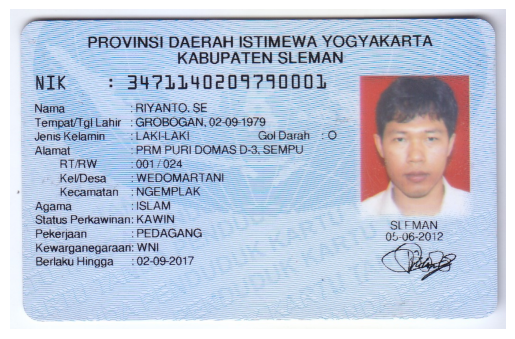

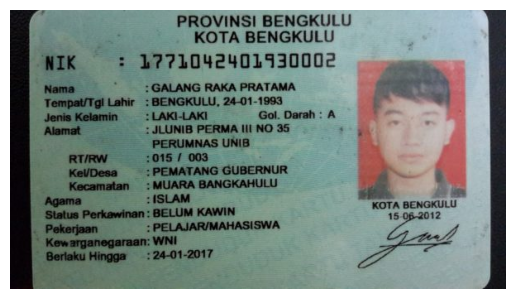

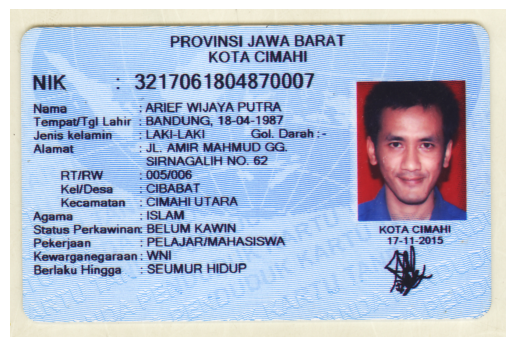

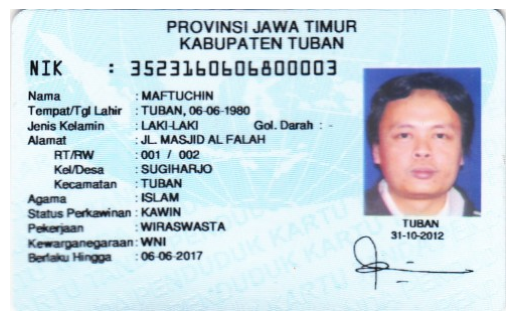

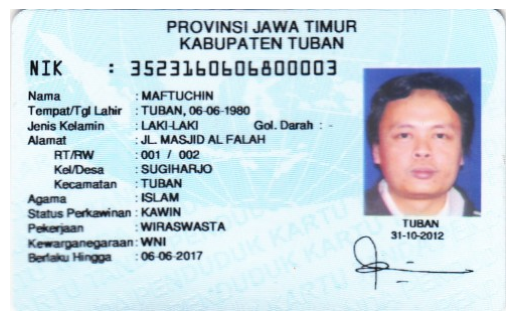

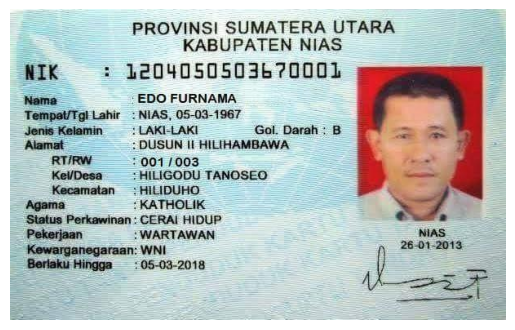

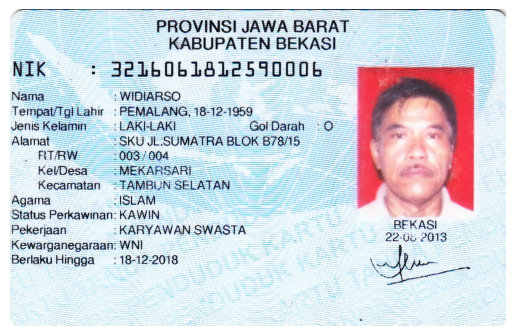

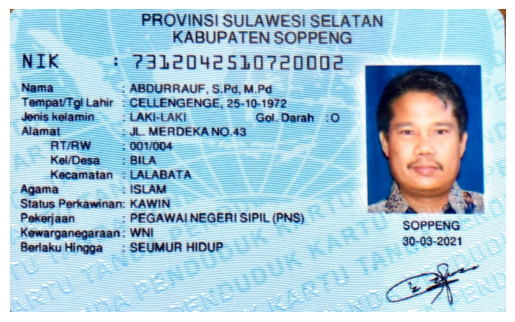

In [105]:
# Mengambil File dari variabel directory
image_files = [file for file in os.listdir(directory) if file.endswith((".jpg", ".jpeg", ".png"))]

# Loop gambar yang ada dalam direktory
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    img = cv2.imread(img_path)

    # Menampilkan Gambar
    plt.figure()
    plt.axis('off')
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()


### **Menggunakan Global Treshold**

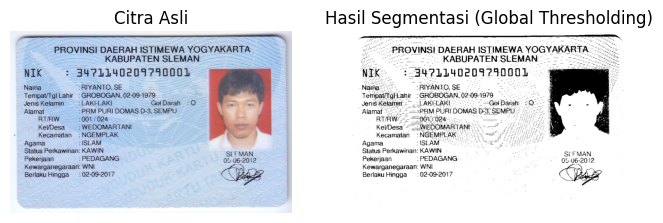

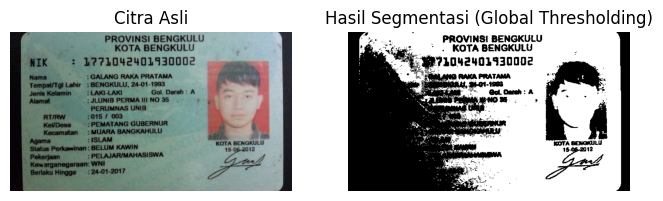

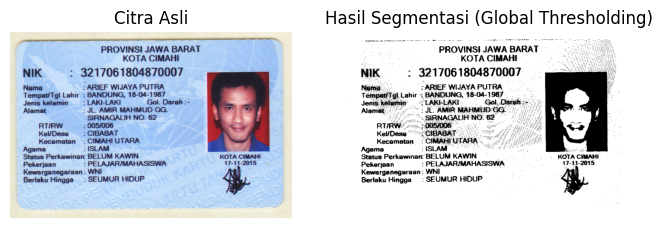

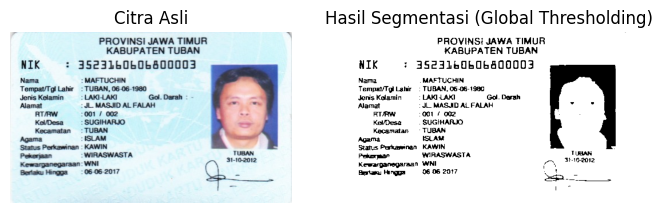

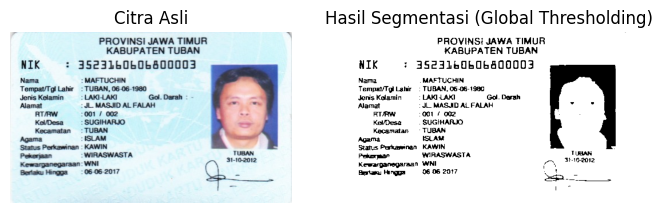

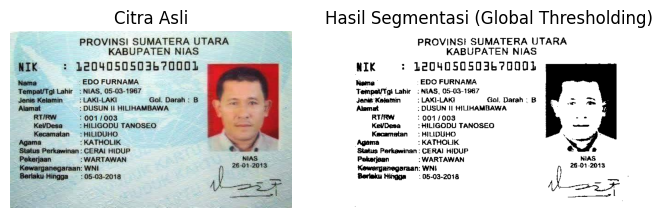

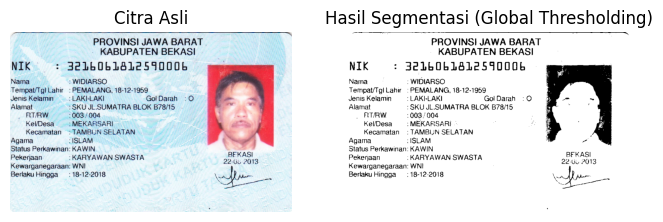

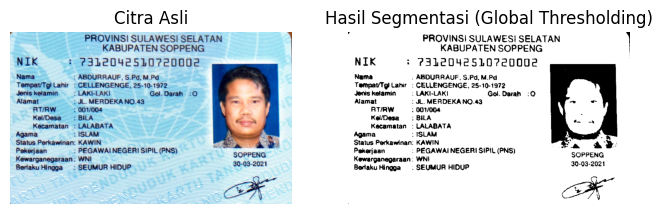

In [106]:
# Ambil File dari direktory
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Global thresholding
    ret, thresholded = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)

    # Menampilkan gambar asli dan hasil segmentasi
    plt.figure(figsize=(8, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Citra Asli')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(thresholded, cmap='gray')
    plt.title('Hasil Segmentasi (Global Thresholding)')
    plt.axis('off')

    plt.show()


### **Menggunakan Adaptive Treshold**

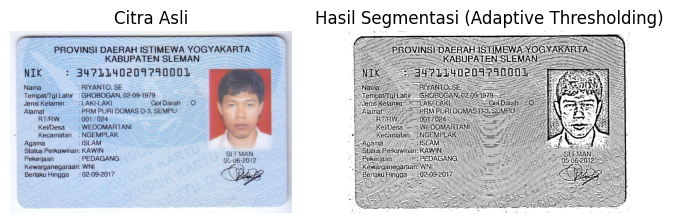

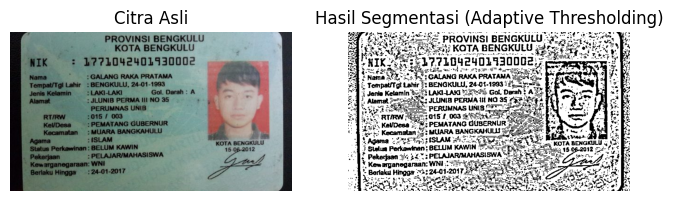

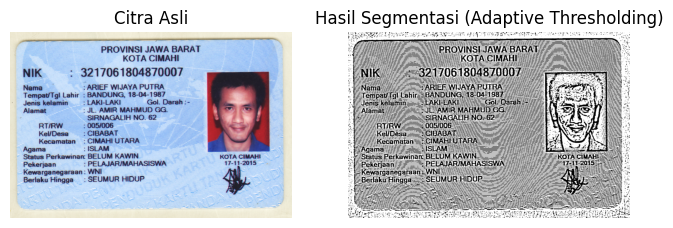

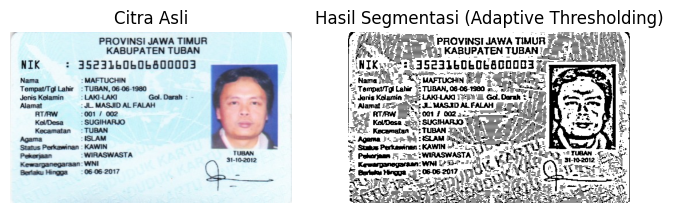

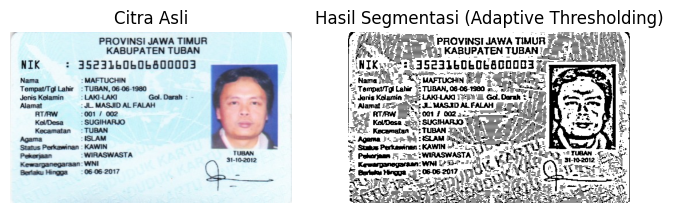

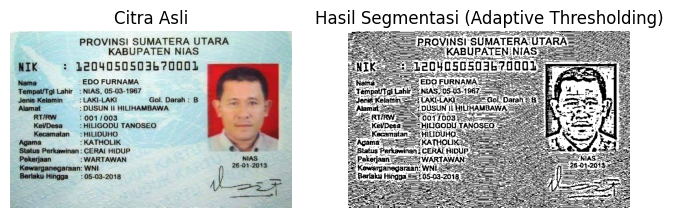

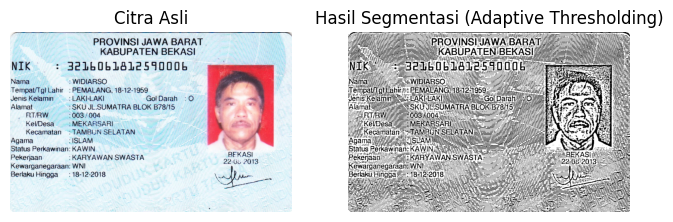

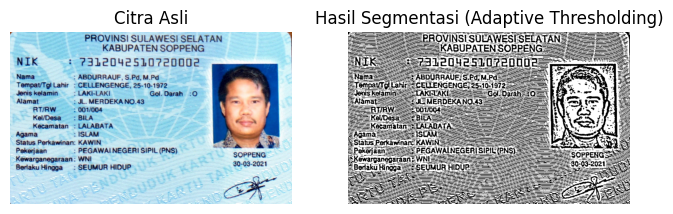

In [107]:
# Loop semua gambar
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Adaptive thresholding
    thresholded = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)

    # Menampilkan gambar asli dan hasil segmentasi
    plt.figure(figsize=(8, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Citra Asli')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(thresholded, cmap='gray')
    plt.title('Hasil Segmentasi (Adaptive Thresholding)')
    plt.axis('off')

    plt.show()


### **Menggunakan Otsu's Treshold**

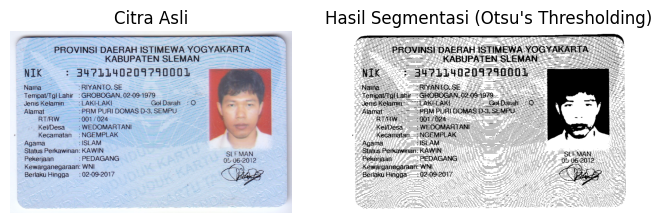

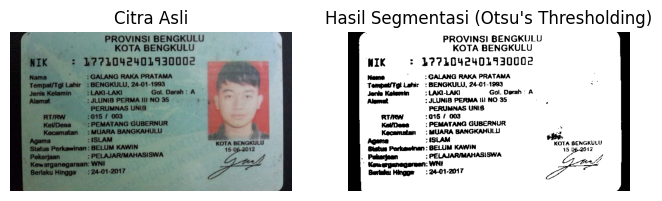

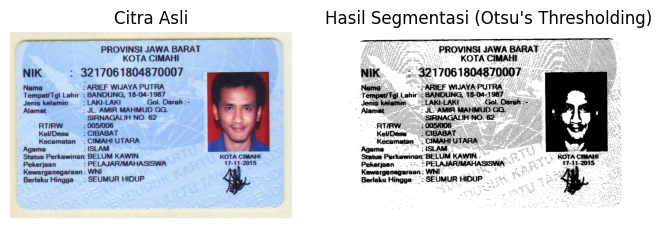

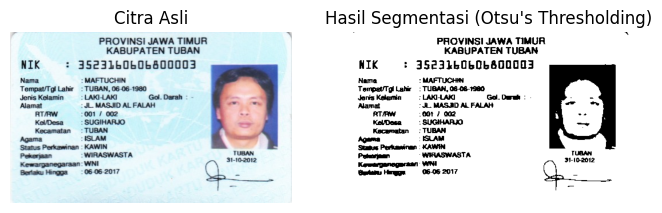

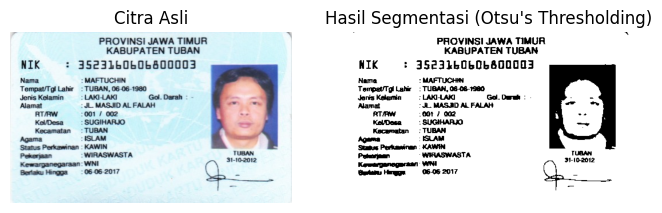

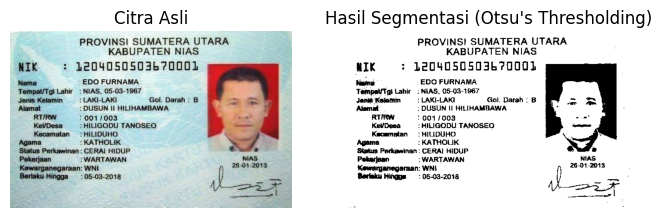

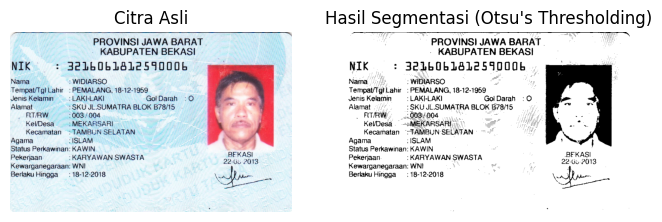

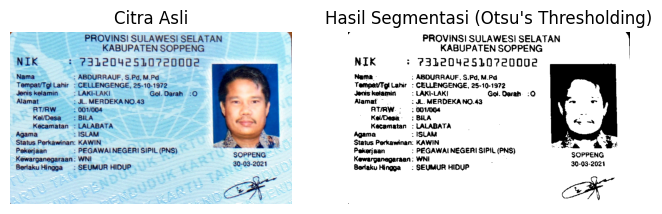

In [108]:
# Loop Semua gambar yang ada dalam direktory
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Otsu's Thresholding
    _, thresholded = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Menampilkan gambar asli dan hasil segmentasi
    plt.figure(figsize=(8, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Citra Asli')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(thresholded, cmap='gray')
    plt.title('Hasil Segmentasi (Otsu\'s Thresholding)')
    plt.axis('off')

    plt.show()


### **Menggunakan Pengenalan Segmentasi Citra menggunakan K-Means**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


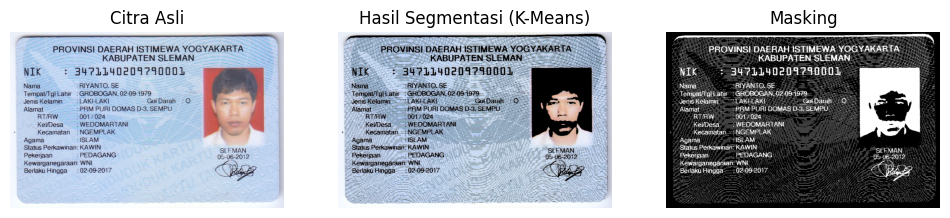

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


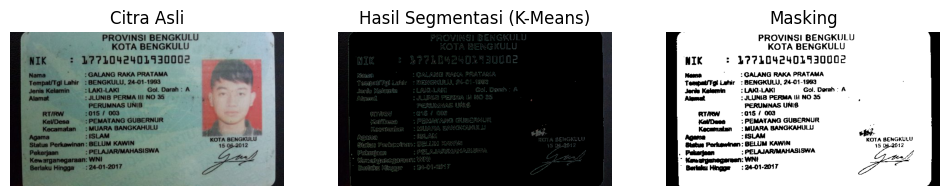

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


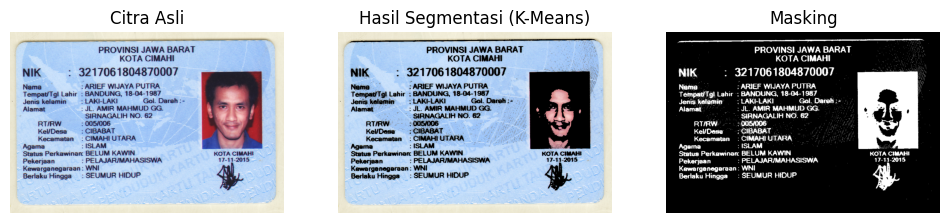

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


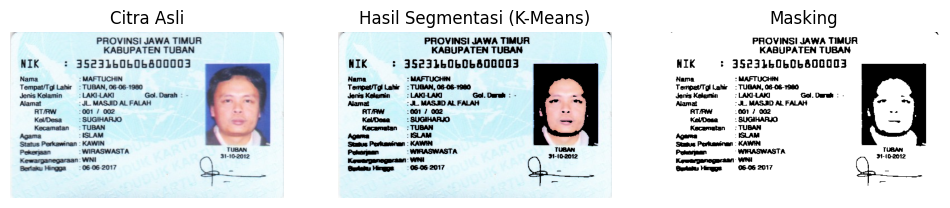

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


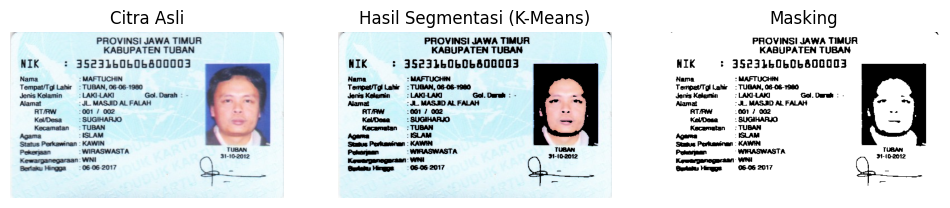

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


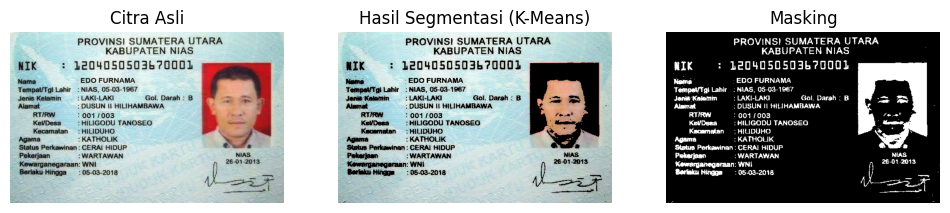

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


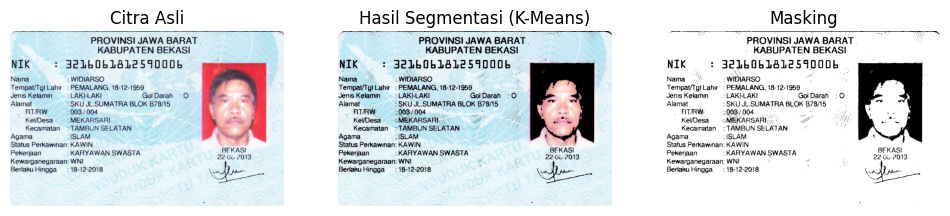

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


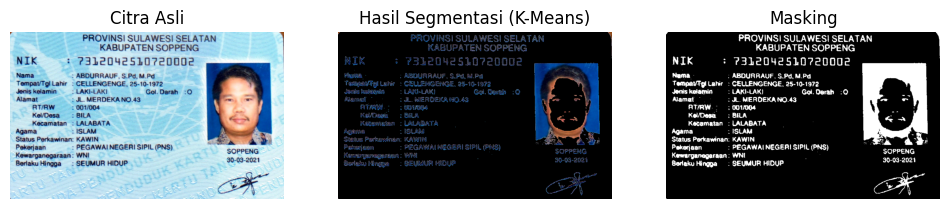

In [110]:
from sklearn.cluster import KMeans

def kmeans_segmentation(image):
    # Ubah citra ke format yang dapat dikerjakan oleh K-Means
    pixel_values = image.reshape((-1, 3))
    pixel_values = np.float32(pixel_values)

    # Terapkan K-Means clustering
    kmeans = KMeans(n_clusters=2, random_state=0)
    kmeans.fit(pixel_values)
    labels = kmeans.labels_.reshape(image.shape[0], image.shape[1])

    # Ambil nilai piksel dari kluster
    blue_cluster = labels[0, 0]
    segmented_image = np.zeros_like(image)
    segmented_image[labels == blue_cluster] = image[labels == blue_cluster]

    return segmented_image, labels

directory = "/content/drive/MyDrive/Semester_5/Pengolahan_Citra_Visi_Komputer/Jobsheet_9/Data/KTP_More"

# Mengambil File dari variabel directory
image_files = [file for file in os.listdir(directory) if file.endswith((".jpg", ".jpeg", ".png"))]

# Loop melalui semua gambar dalam direktori
for img_file in image_files:
    img_path = os.path.join(directory, img_file)

    img = cv2.imread(img_path)

    # Menggunakan K-Means untuk segmentasi
    segmented_image, labels = kmeans_segmentation(img)

    # Menampilkan gambar asli, hasil segmentasi, dan hasil masking
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Citra Asli')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB))
    plt.title('Hasil Segmentasi (K-Means)')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(labels, cmap='gray')
    plt.title('Masking')
    plt.axis('off')

    plt.show()
